 Stufe 1
 Erzeuge Dir Daten mit Hilfe von sklearn.datasets,
 dort die Funktionen make_blobs, make_moons, make_circles,make_regression (eventuell noch Frochtes Mauskopf-Funktion)
 Führe unterschiedliche Clustering-Algorithmen an den Daten aus.
 Lassen sich die Ergebnisse durch Wahl der Parameter verbessern?

 Stufe 2
 Führe eine PCA auf dem Boston-Housing Dataset durch (ebenfalls in sklearn.datasets enthalten)
 Die Ausgangsmenge soll alle Spalten (diesmal wirklich inklusive y) enthalten.
 Plotte die Daten, die durch die Reduktion auf die 2 wichtigsten Spalten entstehen.

 Stufe 3
 Führe auf den reduzierten Daten von Stufe 2 ein Clustering durch. Kann man intuitiv oder grafisch nachweisen,
 dass die Cluster etwas mit dem Preis zu tun haben?

In [1]:
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn import cluster
from sklearn import mixture
from sklearn import neighbors
from sklearn import preprocessing
from itertools import cycle, islice


def make_anisotropic_blobs(n_samples, random_state=None):
    X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
    transformation = np.asarray([[0.6, -0.6], [-0.4, 0.8]])
    X_aniso = np.dot(X, transformation)
    return X_aniso, y


def make_mouse(n_samples, random_state=None):
    np.random.seed(42)
    centers = [(-0.75, 0.75), (0.75, 0.75), (0, 0)]
    Xl, yl = datasets.make_blobs(np.round(n_samples*0.15).astype(int), centers=[(-0.75, 0.75)], cluster_std=0.15)
    Xr, yr = datasets.make_blobs(np.round(n_samples*0.15).astype(int), centers=[(0.75, 0.75)], cluster_std=0.15)
    Xh, yh = datasets.make_blobs(np.round(n_samples*0.7).astype(int), centers=[(0, 0)], cluster_std=0.29)
    X = np.concatenate((Xl, Xr, Xh))
    y = np.concatenate((yl, yr, yh))
    return X, y


n_samples = 1000

circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05)
moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None
aniso = make_anisotropic_blobs(n_samples=n_samples, random_state=170)
varied = datasets.make_blobs(n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=170)
mouse = make_mouse(n_samples=n_samples, random_state=42)



In [2]:
default_base = {'quantile': .3,
                'eps': .3,
                'damping': .9,
                'preference': -200,
                'n_neighbors': 10,
                'n_clusters': 3,
                'min_samples': 20,
                'xi': 0.05,
                'min_cluster_size': 0.1}

datalist = [
    (circles, {'damping': .77, 'preference': -240, 'quantile': .2, 'n_clusters': 2, 'min_samples': 20, 'xi': 0.25}),
    (moons, {'damping': .75, 'preference': -220, 'n_clusters': 2}),
    (blobs, {}),
    (no_structure, {}),
    (aniso, {'eps': .15, 'n_neighbors': 2, 'min_samples': 20, 'xi': 0.1, 'min_cluster_size': .2}),
    (varied, {'eps': .18, 'n_neighbors': 2, 'min_samples': 5, 'xi': 0.035, 'min_cluster_size': .2}),
    (mouse, {'eps': .18, 'n_neighbors': 2, 'min_samples': 5, 'xi': 0.035, 'min_cluster_size': .15})
    ]



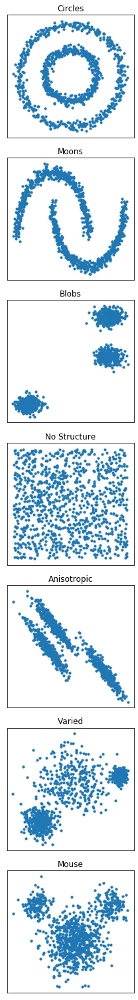

In [3]:
fig, axes = plt.subplots(len(datalist), 1, figsize=(3, 3*len(datalist)))
names = ['Circles', 'Moons', 'Blobs', 'No Structure', 'Anisotropic', 'Varied', 'Mouse']
for i, (dataset, _) in enumerate(datalist):
    X, y = dataset
    axes[i].scatter(X[:, 0], X[:, 1], s=10)
    axes[i].set_title(names[i])
    axes[i].set_xticks([])
    axes[i].set_yticks([])
plt.tight_layout()



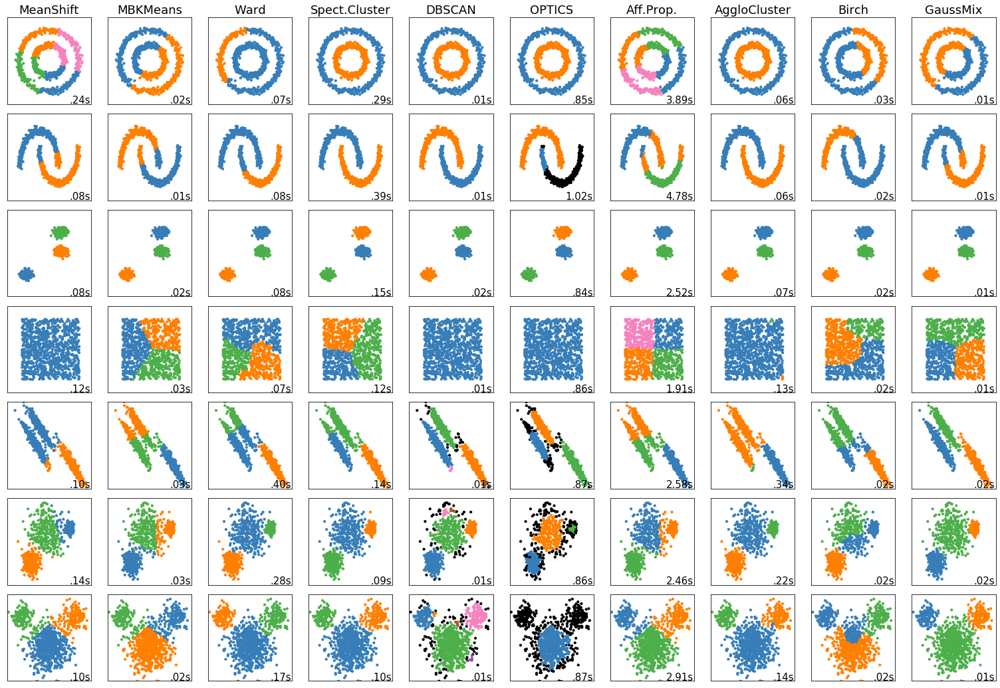

In [4]:
plt.figure(figsize=(21, 14.5))
plot_num = 1

for i, (dataset, algo_params) in enumerate(datalist):
    # update parameters with dataset-specific values
    params = default_base.copy()
    params.update(algo_params)
    X, y = dataset
    # normalize dataset for easier parameter selection
    X = preprocessing.StandardScaler().fit_transform(X)
    clustering_algorithms = []
    # MeanShift:
    bandwidth = cluster.estimate_bandwidth(X, quantile=params['quantile'])
    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
    clustering_algorithms.append(('MeanShift', ms))
    # MiniBatchKMeans:
    two_means = cluster.MiniBatchKMeans(n_clusters=params['n_clusters'])
    clustering_algorithms.append(('MBKMeans', two_means))
    # Ward:
    connectivity = neighbors.kneighbors_graph(X, n_neighbors=params['n_neighbors'], include_self=False)
    connectivity = 0.5 * (connectivity + connectivity.T)  # make connectivity symmetric
    ward = cluster.AgglomerativeClustering(n_clusters=params['n_clusters'], linkage='ward', connectivity=connectivity)
    clustering_algorithms.append(('Ward', ward))
    # SpectralClustering:
    s = cluster.SpectralClustering(n_clusters=params['n_clusters'], eigen_solver='arpack', affinity="nearest_neighbors")
    clustering_algorithms.append(('Spect.Cluster', s))
    # DBSCAN:
    dbscan = cluster.DBSCAN(eps=params['eps'])
    clustering_algorithms.append(('DBSCAN', dbscan))
    # OPTICS:
    op = cluster.OPTICS(min_samples=params['min_samples'], xi=params['xi'], min_cluster_size=params['min_cluster_size'])
    clustering_algorithms.append(('OPTICS', op))
    # AffinityPropagation:
    affinity_propagation = cluster.AffinityPropagation(damping=params['damping'], preference=params['preference'])
    clustering_algorithms.append(('Aff.Prop.', affinity_propagation))
    # AgglomerativeClustering:
    average_linkage = cluster.AgglomerativeClustering(linkage="average", affinity="cityblock",
                                                      n_clusters=params['n_clusters'], connectivity=connectivity)
    clustering_algorithms.append(('AggloCluster', average_linkage))
    # Birch:
    birch = cluster.Birch(n_clusters=params['n_clusters'])
    clustering_algorithms.append(('Birch', birch))
    # GaussianMixture:
    gmm = mixture.GaussianMixture(n_components=params['n_clusters'], covariance_type='full')
    clustering_algorithms.append(('GaussMix', gmm))

    # Iterate over all algorithms:
    for name, algorithm in clustering_algorithms:
        t0 = time.perf_counter()
        algorithm.fit(X)
        t1 = time.perf_counter()
        # Predict:
        if hasattr(algorithm, 'labels_'):
            y_pred = algorithm.labels_.astype(int)
        else:
            y_pred = algorithm.predict(X)
        # Plot:
        plt.subplot(len(datalist), len(clustering_algorithms), plot_num)
        if i == 0:  #  First row gets title:
            plt.title(name, size=18)
        # Generate color cycle:
        colors = np.array(list(islice(cycle(['#377eb8', '#ff7f00', '#4daf4a',
                                             '#f781bf', '#a65628', '#984ea3',
                                             '#999999', '#e41a1c', '#dede00']),
                                      int(max(y_pred) + 1))))
        #add black color for outliers (if any):
        colors = np.append(colors, ["#000000"])
        plt.scatter(X[:, 0], X[:, 1], s=10, color=colors[y_pred])
        plt.xlim(-2.5, 2.5)
        plt.ylim(-2.5, 2.5)
        plt.xticks([])
        plt.yticks([])
        plt.text(.99, .01, ('%.2fs' % (t1 - t0)).lstrip('0'), transform=plt.gca().transAxes,
                 size=15, horizontalalignment='right')
        plot_num += 1
plt.tight_layout()



 # Boston Housing Data set PCA and Clustering:

In [5]:
from sklearn.decomposition import PCA
data = datasets.load_boston()
X, y = datasets.load_boston(return_X_y=True)
X = np.hstack((X, y[:, None]))  # Stack y at the end of X
X = preprocessing.StandardScaler().fit_transform(X)
pca = PCA(n_components=2).fit(X)
X_pca = pca.transform(X)

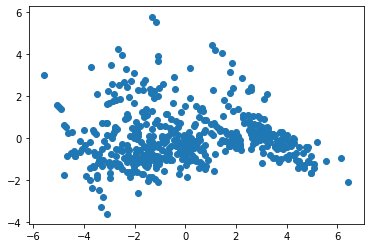

In [6]:
plt.scatter(X_pca[:, 0], X_pca[:, 1])

In [7]:
with np.printoptions(precision=2, suppress=True):
    print(pca.components_)

[[ 0.24 -0.25  0.33 -0.01  0.33 -0.2   0.3  -0.3   0.3   0.32  0.21 -0.2
   0.31 -0.27]
 [-0.07 -0.15  0.13  0.41  0.25  0.43  0.26 -0.36  0.03  0.01 -0.31  0.03
  -0.2   0.44]]


In [8]:
labels = np.concatenate((data['feature_names'], ['MEDV']))

[ 2 13]


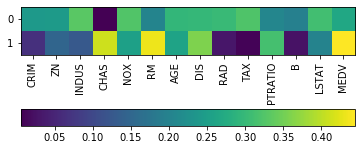

In [9]:
plt.imshow(np.abs(pca.components_), interpolation=None, cmap='viridis')
plt.xticks(np.arange(X.shape[1]), labels, rotation='vertical')
plt.colorbar(orientation='horizontal', pad=0.25)
print(np.argmax(np.abs(pca.components_), axis=1))

[ 2 13]


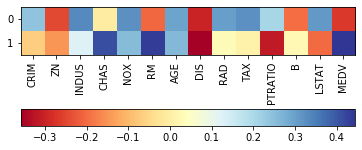

In [10]:
plt.imshow(pca.components_, interpolation=None, cmap='RdYlBu')
plt.xticks(np.arange(X.shape[1]), labels, rotation='vertical')
plt.colorbar(orientation='horizontal', pad=0.25)
print(np.argmax(pca.components_, axis=1))


Text(0.99, 0.01, '.02s')

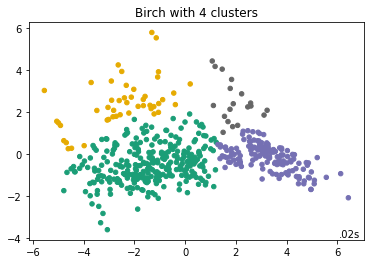

In [11]:
n_clusters = 4
model = cluster.Birch(n_clusters=n_clusters)
t0 = time.perf_counter()
model.fit(X_pca)
t1 = time.perf_counter()
y_pred = model.predict(X_pca)
plt.scatter(X_pca[:, 0], X_pca[:, 1], s=20, c=y_pred, cmap='Dark2')
plt.title(f'{model.__class__.__name__} with {n_clusters} clusters')
plt.text(.99, .01, ('%.2fs' % (t1-t0)).lstrip('0'), transform=plt.gca().transAxes, horizontalalignment='right')